# Connecticut Housing Sales Data

The goal of this project is to see how Assessed Value and Sale Amount change over time. I'm looking for a house on Long Island now, and anyone who is in that process can tell you how inflated the market has become. If you want an easy way to feel depresed, you can always look at how valuable the house you are interested in was just 10 years ago (hint, it'll be half as expensive at most). I'm curious to see if other states have had a similar issue. I also want to take the opportunity to explore the functionality of the folium package to visualize the data in a more effective way.

Since I wanted to host the data files on my Github for any future users' convenience, I had to split the original data file into 6 seperate CSV files so each individual file was under the 25 MB limit. The first cell below grabs each individual file from my Github and concatenates them to reproduce the original file.

This data is orginally from the State of Connecticut Office of Policy and Management, and was sourced from data.gov. The link to the data.gov landing page is as follows: https://catalog.data.gov/dataset/real-estate-sales-2001-2018

GeoJson data used in mapping was sourced fromhttps://deepmaps.ct.gov/datasets/CTDEEP::connecticut-and-vicinity-town-boundary-set/explore?layer=1&location=41.323050%2C-72.511382%2C9

The GeoJson data is alternatively available on my GitHub (you will have to download it since I had trouble linking to a raw version hosted on my GitHub).

## Importing Data

In [41]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
data_file1 = pd.read_csv('https://github.com/akozikow/State_of_Connecticut_Real_Estate_Sales/raw/refs/heads/main/Real_Estate_Sales_2001-2023_GL_1.csv', low_memory = False)
data_file2 = pd.read_csv('https://github.com/akozikow/State_of_Connecticut_Real_Estate_Sales/raw/refs/heads/main/Real_Estate_Sales_2001-2023_GL_2.csv', low_memory = False)
data_file3 = pd.read_csv('https://github.com/akozikow/State_of_Connecticut_Real_Estate_Sales/raw/refs/heads/main/Real_Estate_Sales_2001-2023_GL_3.csv', low_memory = False)
data_file4 = pd.read_csv('https://github.com/akozikow/State_of_Connecticut_Real_Estate_Sales/raw/refs/heads/main/Real_Estate_Sales_2001-2023_GL_4.csv', low_memory = False)
data_file5 = pd.read_csv('https://github.com/akozikow/State_of_Connecticut_Real_Estate_Sales/raw/refs/heads/main/Real_Estate_Sales_2001-2023_GL_5.csv', low_memory = False)
data_file6 = pd.read_csv('https://github.com/akozikow/State_of_Connecticut_Real_Estate_Sales/raw/refs/heads/main/Real_Estate_Sales_2001-2023_GL_6.csv', low_memory = False)
data_file = pd.concat([data_file1, data_file2, data_file3, data_file4, data_file5, data_file6])
data_file = data_file.reset_index()
data_file = data_file.drop(columns = 'index')
data_file.head(3)

,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
0,2020177,2020,04/14/2021,Ansonia,323 BEAVER ST,133000.0,248400.0,0.5354,Residential,Single Family,NaN,NaN,NaN,POINT (-73.06822 41.35014)
1,2020225,2020,05/26/2021,Ansonia,152 JACKSON ST,110500.0,239900.0,0.4606,Residential,Three Family,NaN,NaN,NaN,NaN
2,2020348,2020,09/13/2021,Ansonia,230 WAKELEE AVE,150500.0,325000.0,0.463,Commercial,NaN,NaN,NaN,NaN,NaN


In [42]:
data_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1141722 entries, 0 to 1141721
Data columns (total 14 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   Serial Number     1141722 non-null  int64  
 1   List Year         1141722 non-null  int64  
 2   Date Recorded     1141720 non-null  object 
 3   Town              1141722 non-null  object 
 4   Address           1141671 non-null  object 
 5   Assessed Value    1141722 non-null  float64
 6   Sale Amount       1141722 non-null  float64
 7   Sales Ratio       1141722 non-null  object 
 8   Property Type     759276 non-null   object 
 9   Residential Type  738804 non-null   object 
 10  Non Use Code      324807 non-null   object 
 11  Assessor Remarks  181090 non-null   object 
 12  OPM remarks       14346 non-null    object 
 13  Location          341241 non-null   object 
dtypes: float64(2), int64(2), object(10)
memory usage: 121.9+ MB


## Initial Data Cleaning

Changing 'Date Recorded' format from MM/DD/YYYY to YYYY

In [43]:
data_file['Date Recorded'] = pd.to_datetime(data_file['Date Recorded'], errors = 'coerce').dt.strftime('%Y')
data_file = data_file.dropna(subset = ['Date Recorded'])
data_file['Date Recorded'] = data_file['Date Recorded'].astype('int')
data_file.head(3)

,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
0,2020177,2020,2021,Ansonia,323 BEAVER ST,133000.0,248400.0,0.5354,Residential,Single Family,NaN,NaN,NaN,POINT (-73.06822 41.35014)
1,2020225,2020,2021,Ansonia,152 JACKSON ST,110500.0,239900.0,0.4606,Residential,Three Family,NaN,NaN,NaN,NaN
2,2020348,2020,2021,Ansonia,230 WAKELEE AVE,150500.0,325000.0,0.463,Commercial,NaN,NaN,NaN,NaN,NaN


In [44]:
data_file[['List Year', 'Date Recorded', 'Town', 'Assessed Value', 'Sale Amount', 'Sales Ratio', 'Residential Type']].isnull().sum() #Checking for NAs

List Year                0
Date Recorded            0
Town                     0
Assessed Value           0
Sale Amount              0
Sales Ratio              0
Residential Type    402879
dtype: int64

In [45]:
data_file = data_file[data_file['Residential Type'] == 'Single Family'] #Filtering for only Single Family Homes

In [46]:
data_file['Sales Ratio'] = data_file['Sales Ratio'].astype('float') #changing Sales Ratio to float

In [47]:
data_file['Date Recorded'].unique() #Checking unique years to detect errors

array([2021, 2020, 2022, 2016, 2006, 2007, 2009, 2003, 2011, 2012, 2010,
       2001, 2004, 2008, 2014, 2013, 2019, 2015, 2017, 2018, 2023, 2024])

In [48]:
data_file['List Year'].unique() #Checking unique years to detect errors

array([2020, 2021, 2016, 2006, 2010, 2011, 2007, 2008, 2009, 2013, 2019,
       2012, 2014, 2015, 2018, 2017, 2022, 2023])

In [49]:
data_file['Town'].unique() #Checking list of unique towns for NaN placeholder names

array(['Ansonia', 'Avon', 'Barkhamsted', 'Beacon Falls', 'Berlin',
       'Bethel', 'Bethlehem', 'Bolton', 'Branford', 'Bristol',
       'Brookfield', 'Burlington', 'Canton', 'Cheshire', 'Colchester',
       'Coventry', 'Danbury', 'Darien', 'East Granby', 'East Haddam',
       'East Hartford', 'East Haven', 'East Lyme', 'Easton', 'Enfield',
       'Essex', 'Farmington', 'Glastonbury', 'Goshen', 'Greenwich',
       'Hamden', 'Groton', 'Guilford', 'Litchfield', 'Middletown',
       'Killingworth', 'Lebanon', 'Lisbon', 'Madison', 'Manchester',
       'New Britain', 'Mansfield', 'Meriden', 'Middlebury', 'Monroe',
       'Montville', 'Naugatuck', 'New Canaan', 'New Fairfield',
       'New Haven', 'Newtown', 'Portland', 'North Haven', 'Norwalk',
       'Norwich', 'Somers', 'Old Lyme', 'Old Saybrook', 'Orange',
       'Plainfield', 'Salem', 'Shelton', 'Simsbury', 'Stratford',
       'South Windsor', 'Stonington', 'Waterbury', 'Suffield',
       'Thomaston', 'Watertown', 'Torrington', 'New Lon

In [50]:
data_file = data_file[data_file['Town'] != '***Unknown***'] #Removing entries with ***unknown*** as town name

In [51]:
data_file = data_file[['Serial Number', 'List Year', 'Date Recorded', 'Town', 'Assessed Value', 'Sale Amount', 'Sales Ratio', 'Residential Type', 'Location']]

In [52]:
data_file.info()

<class 'pandas.core.frame.DataFrame'>
Index: 535225 entries, 0 to 1141719
Data columns (total 9 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Serial Number     535225 non-null  int64  
 1   List Year         535225 non-null  int64  
 2   Date Recorded     535225 non-null  int64  
 3   Town              535225 non-null  object 
 4   Assessed Value    535225 non-null  float64
 5   Sale Amount       535225 non-null  float64
 6   Sales Ratio       535225 non-null  float64
 7   Residential Type  535225 non-null  object 
 8   Location          180302 non-null  object 
dtypes: float64(3), int64(3), object(3)
memory usage: 40.8+ MB


By now, we have removed just over half of the enries in the original data set. We will move on to data visualization.

## Exploratory Data Analysis

First, we will look at the numerical features Assessed Value, Sale Amount, and Sales Ratio (Assessed Value divided by Sale Amount) to check to see if there are any extreme entries.

Text(0.5, 1.0, 'Sales Ratio')

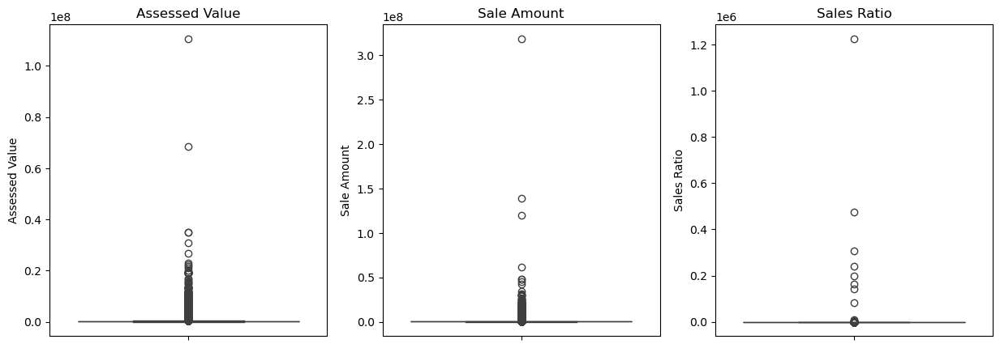

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize = (15, 5))
plt.subplot(1, 3, 1)
sns.boxplot(data_file['Assessed Value'])
plt.title('Assessed Value')
plt.subplot(1, 3, 2)
sns.boxplot(data_file['Sale Amount'])
plt.title('Sale Amount')
plt.subplot(1, 3, 3)
sns.boxplot(data_file['Sales Ratio'])
plt.title('Sales Ratio')

We can see quite a few extreme values. On the Sale Amount Boxplot (the box is barely visible), we can see entries approaching 50 Million. For the sake of our study, we will remove any entires with Assessed or Sales Values over $2 Million, which afterwards will still include the vast majority of reasonably priced single family properties.

In [54]:
data_file = data_file[data_file['Sale Amount'] <= 2000000]
data_file = data_file[data_file['Assessed Value'] <= 2000000]

Text(0.5, 1.0, 'Sales Ratio')

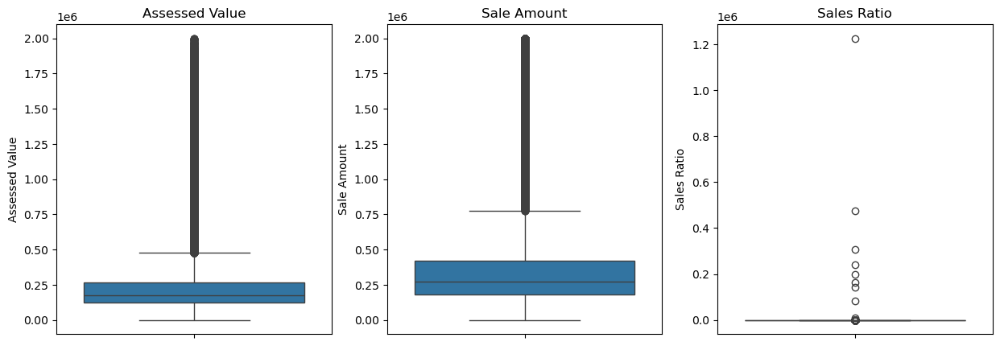

In [55]:
plt.figure(figsize = (15, 5))
plt.subplot(1, 3, 1)
sns.boxplot(data_file['Assessed Value'])
plt.title('Assessed Value')
plt.subplot(1, 3, 2)
sns.boxplot(data_file['Sale Amount'])
plt.title('Sale Amount')
plt.subplot(1, 3, 3)
sns.boxplot(data_file['Sales Ratio'])
plt.title('Sales Ratio')

The Boxplots look a little more reasonable now, but we still see some outliers on the Sales Ratio boxplot. Lets take a closer look at those. There are 1618 properties with more than a 10x ratio between Sale and Assessed Price, which is represented by the Sales Ratio. For the sake of cleaning up the analysis, we will remove these

In [56]:
len(data_file[data_file['Sales Ratio'] >= 10])

1618

In [57]:
data_file = data_file[data_file['Sales Ratio'] <= 10]

Text(0.5, 1.0, 'Sales Ratio Histogram')

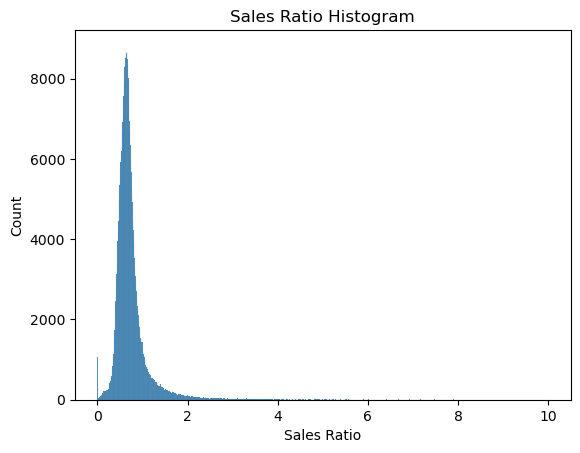

In [58]:
sns.histplot(data_file['Sales Ratio'])
plt.title('Sales Ratio Histogram')

Now that we can see better, almost all (99%) the entries fall between 0 and 3 Sales Ratio. There are also some properties with Sales Ratios of 0. We will remove properties with Sales Ratios above 3, and any properties that have Assessed Values, Sale Amounts, or Sales Ratios of 0.

In [59]:
len(data_file[data_file['Sales Ratio'] == 0]) #finding number of entries where Sales Ratio is 0

978

In [60]:
(len(data_file[data_file['Sales Ratio'] < 3]) / len(data_file['Sales Ratio']))*100 #finding percentage of propterties with Sales Ratio > 3

99.026980823262

In [61]:
data_file = data_file[data_file['Sale Amount'] != 0] #removing entries where Sale Amount is 0
data_file = data_file[data_file['Assessed Value'] != 0] #removing entries where Assessed Value is 0
data_file = data_file[data_file['Sales Ratio'] != 0] #removing entries where Sales Ratio is 0
data_file = data_file[data_file['Sales Ratio'] <= 3] #removing entries where Sale Amount is greater than 3
print(f' Number of Entries Remaining: {len(data_file)}') 

 Number of Entries Remaining: 515730


Text(0.5, 1.0, 'Sales Ratio Histogram')

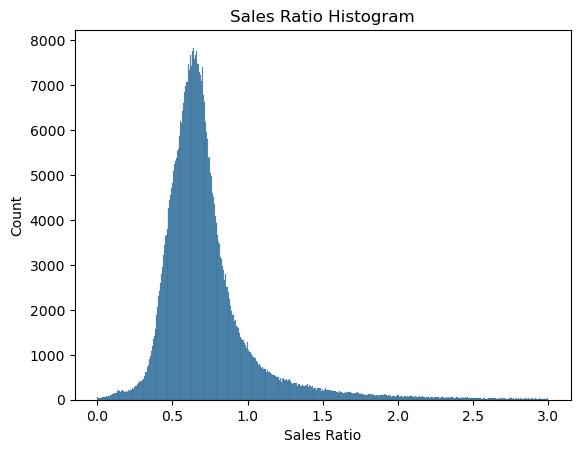

In [62]:
sns.histplot(data_file['Sales Ratio'])
plt.title('Sales Ratio Histogram')

If we were doing predictive modeling using the Sales Ratio data, the positive skew of the data would be an issue, and might warrant a log transformation or further indexing to get the data to be more normally distributed. Being that we are not, this looks fine.

Text(0.5, 1.0, 'Sales Ratio Histogram')

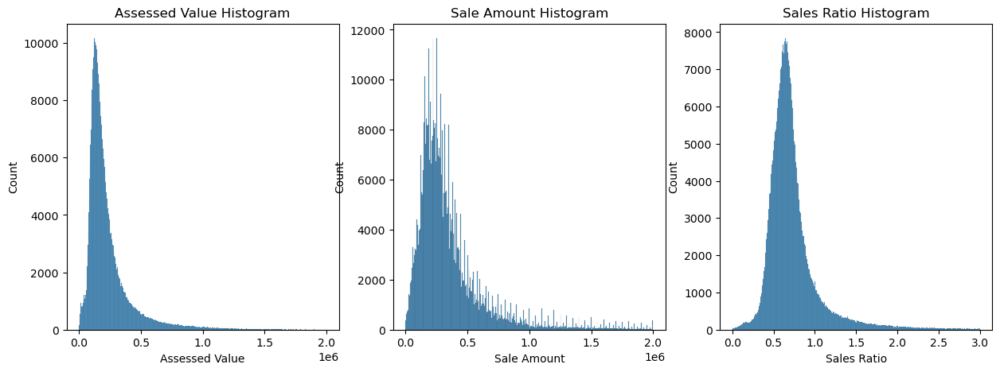

In [63]:
plt.figure(figsize = (15, 5))
plt.subplot(1, 3, 1)
sns.histplot(data_file['Assessed Value'])
plt.title('Assessed Value Histogram')
plt.subplot(1, 3, 2)
sns.histplot(data_file['Sale Amount'])
plt.title('Sale Amount Histogram')
plt.subplot(1, 3, 3)
sns.histplot(data_file['Sales Ratio'])
plt.title('Sales Ratio Histogram')

The Sale Amount histogram looks strange, but this is only because it is much more common for Sale Amounts to be at certain values (e.g., 500,000 is much more likely than 493,456). We will now take a look at how Sales Ratio changes over the time span of the collected data. We wil be using the median instead of the mean for this to be more robust to extreme values.

Text(0.5, 0, 'Year')

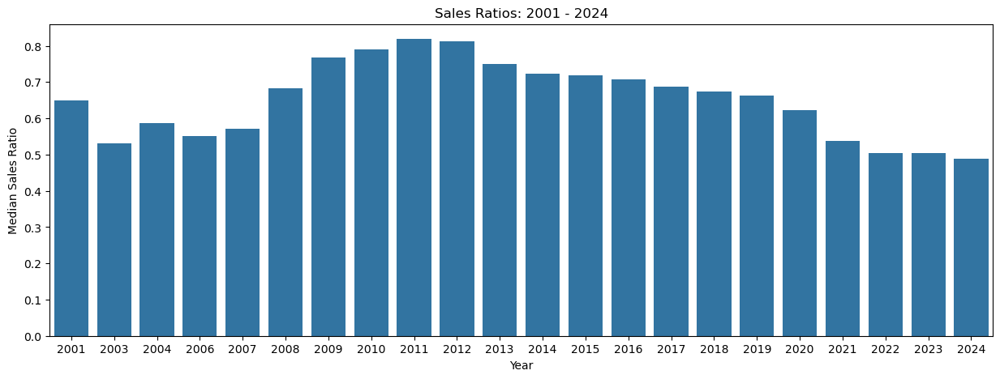

In [64]:
plt.figure(figsize = (15, 5))
sns.barplot(data_file.groupby('Date Recorded')['Sales Ratio'].median())
plt.title('Sales Ratios: 2001 - 2024')
plt.ylabel('Median Sales Ratio')
plt.xlabel('Year')

The Sales Ratio, which again is Assessed Value divided by Sale Amount, peaks around 2011 and decreases gradually over time. This indicates that Sale Amount is increasing faster than Assessed Value. To gain a better understanding of the data, we will plot median Assessed Values and Sale Amounts.

Text(0.5, 0, 'Year')

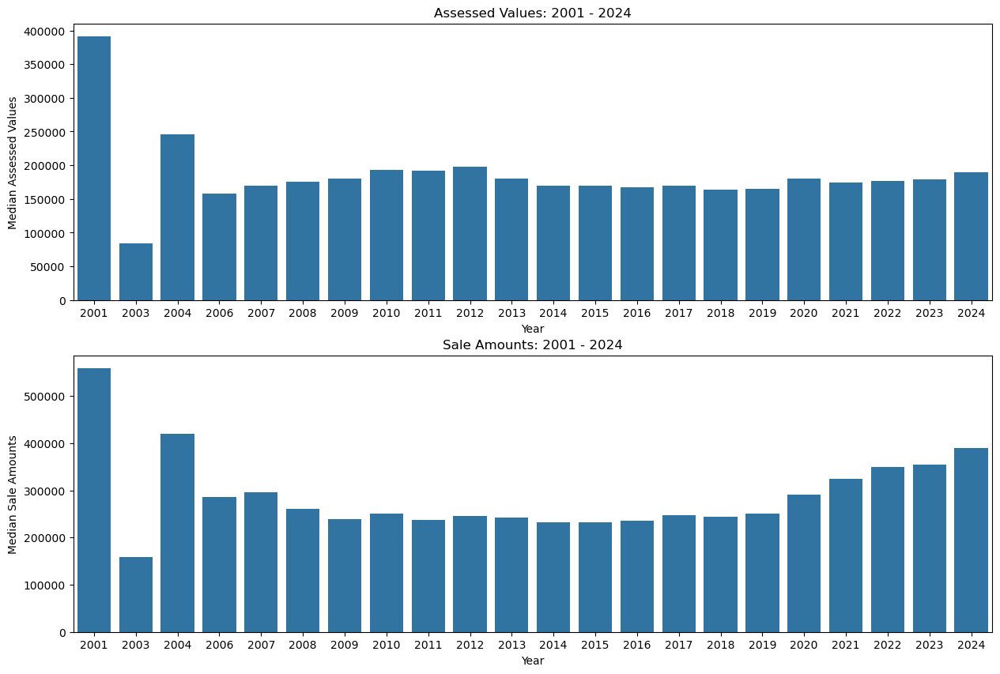

In [65]:
plt.figure(figsize = (15, 10))
plt.subplot(2, 1, 1)
sns.barplot(data_file.groupby('Date Recorded')['Assessed Value'].median())
plt.title('Assessed Values: 2001 - 2024')
plt.ylabel('Median Assessed Values')
plt.xlabel('Year')
plt.subplot(2, 1, 2)
sns.barplot(data_file.groupby('Date Recorded')['Sale Amount'].median())
plt.title('Sale Amounts: 2001 - 2024')
plt.ylabel('Median Sale Amounts')
plt.xlabel('Year')

The individual Assessed Value and Sale Amounts corroborate what we see in the Sales Ratio bar graph. From the years 2008-2019, median Sale Amounts remain stable, with a pronnounced uptick starting from 2019-2020. This is in contrast to the Assessed Values, which remain consistent across this span. While much has been said about the increased demand COVID-19 put on the real estate market as city-dwellers fled to the suburbs during the pandemic, thus creating a spike in demand that has never normalized, the reasons for this increase could in truth be more complicated.

To interrogate this claim, we will utilize the folium package to visualize the percent increase in median sales prices over the time period 2018-2023 (years where we have data for every town) for each town and whether towns closer to large population centers are more affected by this increase.

## Building an Interactive Map with Folium

In the section below, we will build an interactive map using the folium python package using GeoJson data. We will focus in on the dramatic increase in sale prices and note the largest cities in Connecticut to gain context on how proximity to large population centers may affect this increase. First, we will have do download the GeoJson data.

NOTE: To replicate this code you will have to download the file from my Github page (linked at the top). I had trouble linking to the raw document from my GitHub.

In [66]:
import json
!pip install --quiet geopandas
import geopandas
!pip install --quiet folium
import folium
data = geopandas.read_file('Downloads/Connecticut_and_Vicinity_Town_Boundary_Set_5390189883591282727.geojson')
conn_geopandas = geopandas.GeoDataFrame.from_features(data, crs="EPSG:4326")
conn_geopandas = conn_geopandas[conn_geopandas['STATE_NAME'] == 'Connecticut']
conn_geopandas = conn_geopandas[conn_geopandas['LABEL_FLAG'] == 'True']
conn_geopandas.head(3)

,geometry,OBJECTID,LAND_CLASS,CT_LEGEND,STATE_COD,STATE_NAME,CNTY_FIELD,CNTY_COD,CNTY_NAME,TOWN_FIELD,TOWN_NAME,LABEL_FLAG,MAP_LABEL,CT_LABEL_Y,CT_LABEL_N
22,"POLYGON ((-73.34064 42.04837, -73.34062 42.048...",23,Land,Connecticut,CT,Connecticut,CNTY_COD,3,Litchfield,TOWN_NO,Salisbury,True,Salisbury,Salisbury,
25,"POLYGON ((-73.29629 42.047, -73.28804 42.04678...",26,Land,Connecticut,CT,Connecticut,CNTY_COD,3,Litchfield,TOWN_NO,North Canaan,True,North Canaan,North Canaan,
26,"POLYGON ((-73.17214 42.0434, -73.16961 42.0433...",27,Land,Connecticut,CT,Connecticut,CNTY_COD,3,Litchfield,TOWN_NO,Norfolk,True,Norfolk,Norfolk,


I wanted to take a look at the percent increase from the years 2018 to 2023 (the closest years to 2019 and 2024 that had data for all towns).

In [67]:
begin_median_sales = data_file[data_file['Date Recorded'] == 2018]
begin_median_sales = pd.DataFrame(begin_median_sales.groupby('Town')['Sale Amount'].median())
begin_median_sales = begin_median_sales.reset_index()
begin_median_sales = begin_median_sales.rename(columns = {'Sale Amount' : '2018 Sale Median'})
end_median_sales = data_file[data_file['Date Recorded'] == 2023]
end_median_sales = pd.DataFrame(end_median_sales.groupby('Town')['Sale Amount'].median())
end_median_sales = end_median_sales.reset_index()
end_median_sales = end_median_sales.rename(columns = {'Sale Amount' : '2023 Sale Median'})
median_sales_perdiff = pd.merge(
    begin_median_sales,
    end_median_sales,
    on = 'Town')
median_sales_perdiff.head(3)

,Town,2018 Sale Median,2023 Sale Median
0,Andover,245000.0,365000.0
1,Ansonia,195000.0,300000.0
2,Ashford,176250.0,345000.0


In [68]:
median_sales_perdiff['Percent Difference'] = ((median_sales_perdiff['2023 Sale Median'] - median_sales_perdiff['2018 Sale Median']) / median_sales_perdiff['2018 Sale Median'])*100
median_sales_perdiff.head(3)

,Town,2018 Sale Median,2023 Sale Median,Percent Difference
0,Andover,245000.0,365000.0,48.979592
1,Ansonia,195000.0,300000.0,53.846154
2,Ashford,176250.0,345000.0,95.744681


In [69]:
conn_merge = conn_geopandas.merge(median_sales_perdiff, how = 'left', left_on = 'TOWN_NAME', right_on = 'Town')
conn_merge = conn_merge.drop(columns = ['Town'])
conn_merge.head(3)

,geometry,OBJECTID,LAND_CLASS,CT_LEGEND,STATE_COD,STATE_NAME,CNTY_FIELD,CNTY_COD,CNTY_NAME,TOWN_FIELD,TOWN_NAME,LABEL_FLAG,MAP_LABEL,CT_LABEL_Y,CT_LABEL_N,2018 Sale Median,2023 Sale Median,Percent Difference
0,"POLYGON ((-73.34064 42.04837, -73.34062 42.048...",23,Land,Connecticut,CT,Connecticut,CNTY_COD,3,Litchfield,TOWN_NO,Salisbury,True,Salisbury,Salisbury,,407500.0,750000.0,84.049080
1,"POLYGON ((-73.29629 42.047, -73.28804 42.04678...",26,Land,Connecticut,CT,Connecticut,CNTY_COD,3,Litchfield,TOWN_NO,North Canaan,True,North Canaan,North Canaan,,163625.0,240000.0,46.676853
2,"POLYGON ((-73.17214 42.0434, -73.16961 42.0433...",27,Land,Connecticut,CT,Connecticut,CNTY_COD,3,Litchfield,TOWN_NO,Norfolk,True,Norfolk,Norfolk,,350000.0,380000.0,8.571429


Below, we will start building out our folium elements. We will begin by instantiating a folium.Map object, followed by adding a few elements to that map (e.g., a colormap for shading information and a tooltip for mouseover behavior).

In [70]:
import branca
colormap = branca.colormap.LinearColormap(
    vmin=conn_merge["Percent Difference"].quantile(0.0),
    vmax=conn_merge["Percent Difference"].quantile(1),
    colors=['darkgreen','yellow', 'red'],
    caption="Percent Change from 2018-2023",
)
z = folium.Map(location = [41.5658, -72.6734], zoom_start=9)

In [71]:
tooltip = folium.GeoJsonTooltip(
    fields=["TOWN_NAME", "Percent Difference"],
    aliases=["Town:", "Percent Change (2018-2023)"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800
)

In [72]:
folium.GeoJson(
    conn_merge,
    style_function=lambda x: {
        "fillColor": colormap(x["properties"]["Percent Difference"])
        if x["properties"]["Percent Difference"] is not None
        else "transparent",
        "color": "black",
        "fillOpacity": 0.7,
    },
    tooltip = tooltip,
).add_to(z)
colormap.add_to(z)
z

Above, we can see the towns outlined and shaded according to the percent increase in median Sale Amount from 2018-2023. Low (possibly negative) percent changes are in green, while red signifies very high percent changes. One can hover over each town to see the town Name and the Percent Change of the median Sale Amount from 2018-2023. We will further refine this map by adding map markers with the 5 largest cities in Connecticut by population (as of 2023).

In [73]:
biggest_cities = pd.DataFrame({
    'City' : ['Bridgeport', 'Stamford', 'New Haven', 'Hartford', 'Waterbury'],
    'Population' : [148030, 136230, 135320, 121127, 114869],
    'Latitude' : [41.1865, 41.0528, 41.3083, 41.7658, 41.5582],
    'Longitude' : [-73.1952, -73.5395, -72.9279, -72.6734, -73.0515]
})

In [74]:
for index, row in biggest_cities.iterrows():
    folium.Marker(
        location = [row['Latitude'], row['Longitude']],
        popup = f"""
        <b>Name:</b> {row['City']}
        <b>Population:</b> {row['Population']}
        """
    ).add_to(z)
z

We can see from the above graph with the population center markers (clicking on them reveals the City Name and Population) that the percent changes are not necessarily the highest around these areas. We will next take a look at the raw change in Sale Amount.

In [75]:
median_sales_perdiff['Median Sale Difference'] = median_sales_perdiff['2023 Sale Median'] - median_sales_perdiff['2018 Sale Median']
conn_merge_1 = conn_geopandas.merge(median_sales_perdiff, how = 'left', left_on = 'TOWN_NAME', right_on = 'Town')
conn_merge_1 = conn_merge_1.drop(columns = ['Town', '2018 Sale Median', '2023 Sale Median'])

In [76]:
x = folium.Map(location = [41.5658, -72.6734], zoom_start=9)
colormap1 = branca.colormap.LinearColormap(
    vmin=conn_merge_1["Median Sale Difference"].quantile(0.0),
    vmax=conn_merge_1["Median Sale Difference"].quantile(1),
    colors=['darkgreen','yellow', 'red'],
    caption="Median Sale Difference Between 2018 and 2023",
)
tooltip1 = folium.GeoJsonTooltip(
    fields=["TOWN_NAME", "Median Sale Difference"],
    aliases=["Town:", "Median Sale Difference"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800
)
folium.GeoJson(
    conn_merge_1,
    style_function=lambda x: {
        "fillColor": colormap1(x["properties"]["Median Sale Difference"])
        if x["properties"]["Median Sale Difference"] is not None
        else "transparent",
        "color": "black",
        "fillOpacity": 0.7,
    },
    tooltip = tooltip1,
).add_to(x)
colormap1.add_to(x)
for index, row in biggest_cities.iterrows():
    folium.Marker(
        location = [row['Latitude'], row['Longitude']],
        popup = f"""
        <b>Name:</b> {row['City']}
        <b>Population:</b> {row['Population']}
        """
    ).add_to(x)
x

We can see some commonalities and some stark differences between the percent change and raw change maps. For example, Weston (West of Bridgeport) had a middling percent change of about +58% from the years 2018 to 2023, but was the highest in raw change at increase of $402,000 in that same time. We wll look at one more map to get a better understanding of the situation, which will display the median Sale Amount for the year 2018 (the start of our range for the earlier percent change graph).

In [77]:
conn_merge_2 = conn_geopandas.merge(begin_median_sales, how = 'left', left_on = 'TOWN_NAME', right_on = 'Town')
conn_merge_2 = conn_merge_2.drop(columns = ['Town'])
conn_merge_2.head(3)

,geometry,OBJECTID,LAND_CLASS,CT_LEGEND,STATE_COD,STATE_NAME,CNTY_FIELD,CNTY_COD,CNTY_NAME,TOWN_FIELD,TOWN_NAME,LABEL_FLAG,MAP_LABEL,CT_LABEL_Y,CT_LABEL_N,2018 Sale Median
0,"POLYGON ((-73.34064 42.04837, -73.34062 42.048...",23,Land,Connecticut,CT,Connecticut,CNTY_COD,3,Litchfield,TOWN_NO,Salisbury,True,Salisbury,Salisbury,,407500.0
1,"POLYGON ((-73.29629 42.047, -73.28804 42.04678...",26,Land,Connecticut,CT,Connecticut,CNTY_COD,3,Litchfield,TOWN_NO,North Canaan,True,North Canaan,North Canaan,,163625.0
2,"POLYGON ((-73.17214 42.0434, -73.16961 42.0433...",27,Land,Connecticut,CT,Connecticut,CNTY_COD,3,Litchfield,TOWN_NO,Norfolk,True,Norfolk,Norfolk,,350000.0


In [78]:
y = folium.Map(location = [41.5658, -72.6734], zoom_start=9)
colormap2 = branca.colormap.LinearColormap(
    vmin=conn_merge_2["2018 Sale Median"].quantile(0.0),
    vmax=conn_merge_2["2018 Sale Median"].quantile(1),
    colors=['darkgreen','yellow', 'red'],
    caption="Median Sale Price: 2018",
)
tooltip2 = folium.GeoJsonTooltip(
    fields=["TOWN_NAME", "2018 Sale Median"],
    aliases=["Town:", "Median Sale Price"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800
)
folium.GeoJson(
    conn_merge_2,
    style_function=lambda x: {
        "fillColor": colormap2(x["properties"]["2018 Sale Median"])
        if x["properties"]["2018 Sale Median"] is not None
        else "transparent",
        "color": "black",
        "fillOpacity": 0.7,
    },
    tooltip = tooltip2,
).add_to(y)
colormap2.add_to(y)
for index, row in biggest_cities.iterrows():
    folium.Marker(
        location = [row['Latitude'], row['Longitude']],
        popup = f"""
        <b>Name:</b> {row['City']}
        <b>Population:</b> {row['Population']}
        """
    ).add_to(y)
y

With this map, it becomes apparent that proximity to New York City is a likely a primary driver for high housing prices in southwest Connecticut, with towns like Greenwich likely acting as New York City suburbs despite being in a different state. Those towns nearest New York City had the highest median Sale Amounts in 2018, while the rest of Connecticut is more uniform (usually bounded between 200,000 and 400,000).

To summarize, it seems like towns that started off with rather low Sale Amounts in 2018 experienced the highest percent increase between then and 2023. To put it another way, the most drastic changes in terms of percentage occur in cheaper areas. For example, the previously noted Greenwich had a median sale price of over a million dollars to begin with, but that median sale price only increased 11% over the five year timeframe. This is in contrast to a town like Sterling (on the eastern edge of the state and bright red in the percent change graph) which had a whopping ~130% price increase, but only started in 2018 with a median sale price of $180000; this is less than 1/5th of where Greenwhich was starting in that year.

Overall, it seems that the middle class is the hardest hit by the rising prices in the housing market over this timeframe, while the richer areas suffer proportionately lesser increases. To further understand what is driving price increases in some localities and not others would be a whole other project in and of itself (e.g., due to gentrification, school districts, etc.). Suffice it to say, my hypothesis that the towns near Connecticut's largest cities would see the largest increases did not turn out to be true. Any such effect is dwarfed by that same phenomenon being generated by New York City, which has a population almost 80 times larger than the largest city in Connecticut at over 8 million. 

While the idea that real estate near New York City is expensive is not necessarily groundbreaking, I hope that you were able to glean something from my project. I certainly learned a lot making it, and I wil try to create a dashboard to make the information more accessible. Thank you for taking the time to review it.